<a href="https://colab.research.google.com/github/jansoe/AICA/blob/main/monophonicBachLSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Automatische Erzeugung musikalischer Sequenzen

Ähnlich der Sprache ist Musik ein Medium, dessen zeitliche Struktur wesentlich zum Informationsgehalt beiträgt. Die relevanten Zeitskalen erstrecken sich hierbei vom Millisekundenbereich, in dem die Texturen und Tonhöhen der Noten geformt werden, bis auf die Größenordnung mehrerer Minuten, wo sich die musikalischen Zusammenhänge und Spannungsbögen einer Kompositionen abspielen. 

Die Erfassung all dieser Zeitskalen auf Basis reiner Wellen- oder Spektrogrammdaten erfordert riesige, hochkomplizierte Netzwerke und einen Haufen Rechenleistung. Um einige dieser Schwierigkeiten zu umgehen, modellieren wir hier Musik auf der symbolischen Ebene des *Midi-Protokolls*, das viele von Ihnen schon kennen werden. 

Weiterhin werden Sie hier die Klasse der  *rekurrenten Netzwerke* kennenlernen. Diese eignet sich insbesondere zum Modellieren und Generieren von Zeitreihen. Sie werden lernen, wie diese Netzwerke auf Musikdaten trainiert werden können, um darauf aufbauend neue musikalische Sequenzen zu erzeugen.

Das Ganze ist ziemlich technisch und soll einen Eindruck davon geben, wie viele Schritte oft nötig sind, um zu einem recht einfach erscheinenden Ergebnis zu kommen. Machen Sie sich also keine Sorgen, wenn Sie nicht jeden einzelnen Schritt versten.


## 1.0 Rekurrente Neuronal Netze

In vielen Anwendungsfällen, wie zum Beispiel in der Bilderkennung, kommt man mit *Feed-Forward-Netzen* aus, also mit Netzen, bei denen der Informationsfluss stets nur in einer Richtung stattfindet: Vom Input in Richtung Ouput. Insbesondere bei der Verarbeitung von Zeitreihen, bei denen aufeinanderfolgende Inputs miteinander im Zusammenhang stehen, kann es hilfreich sein, wenn das Netzwerk auch über seinen eigenen Zustand in der Vergangenheit informiert ist. Die einfachste Methode dies zu erreichen ist ein *Feedback-Loop*, also eine Verbindung einer Zelle zu seinem eigenen Zustand im letzten Zeitschritt.

![](https://upload.wikimedia.org/wikipedia/commons/d/dd/RecurrentLayerNeuralNetwork.png)

(Quelle: https://upload.wikimedia.org/wikipedia/commons/d/dd/RecurrentLayerNeuralNetwork.png)

Doch wie trainiert man ein solches rekurrentes Netzwerk? Für den Backpropagation-Algorithmus, den wir bisher kennen, benötigen wir ja einen direkten Pfad vom Output zu jedem Gewicht und können die Fehler nicht im Kreis herumpropagieren. 

Dieses Problem wird im Backpropagation-through-time Algorithmus ([BPTT](https://en.wikipedia.org/wiki/Backpropagation_through_time)) durch einen Trick umgangen. Es wird eine feste Anzahl von Zeitschritten definiert, die man für das zu trainierende Problem für relevant hält. Die einzelnen Zeitschritte werden dann *ausgerollt*, man tut also so, als wäre jeder vorherige Zeitschritt eine weitere Schicht des Netzwerks. Auf dieser *ausgerollten* Netzwerkstruktur kann dann wieder der normale Backpropagation-Algorithmus angewendet werden. Durch diesen Trick steigt die Größe des ausgerollten Netzwerks, und damit der Rechenaufwand, mit der Anzahl der betrachteten Zeitschritte an. 

In der Praxis zeigte sich schnell, dass in solchen Netzwerken, wie auch bei anderen tiefen Netzen, der Gradient schnell *verloren geht*, das Training also nicht effektiv ist. Auch kann das Netzwerk nicht zwischen wichtigen und unwichtigen Informationen aus der Vergangenheit unterscheiden und macht es zudem schwer, länger zurückliegende Zusammenhänge abzubilden. 

[Schmidhuber und Hochreiter](https://www.bioinf.jku.at/publications/older/2604.pdf) schlugen deshalb schon 1997 die [Long short-term memory-Zelle](https://de.wikipedia.org/wiki/Long_short-term_memory) vor. Hier wird durch eine Anzahl von *Gates* entschieden, ob Informationen erinnert, vergessen oder weitergeleitet werden sollen. 

![](https://upload.wikimedia.org/wikipedia/commons/d/d5/Long_Short_Term_Memory.png)

(Quelle: https://upload.wikimedia.org/wikipedia/commons/d/d5/Long_Short_Term_Memory.png)

Da damals die nötigen Datenmengen und die Rechenleistung fehlte, konnten LSTM-Netzwerke erst 20-Jahre später ihre Blütezeit erleben und wurden ab 2016 in vielen Anwendungen der großen Techfirmen benutzt, bis sie 2018 von den Transformer-basierten Algorithmen abgelöst wurden. 

Obwohl es sich seit einigen Jahren um eine *veraltete* Technik handelt, wollen wir Ihnen trotzdem Zeigen, wie Sie die LSTM-Module in Keras zum generieren von Sequenzen benutzen können, da hier mit kleinerem Rechenaufwand viele Konzepte gezeigt werden können, die auch in moderneren Algorithmen verwendet werden.


## 2.0 MIDI

Das Musical Instrument Digital Interface oder [MIDI](https://de.wikipedia.org/wiki/Musical_Instrument_Digital_Interface)-Protokoll ist ein 1982 geschaffener Standard für die Kommunikation zwischen verschiedenen elektronischen Instrumenten. Hierbei können Befehle über Tonhöhe, Lautstärke und Dauer zwischen Keyboards und Synthesizern hin und her geschickt werden. 

Für uns ist Midi von Interesse, da es sich auch zum Standard für das Abspreichern von Musikstücken in digitaler Form, quasi als digitale Notenschrift, etabliert hat. Es ist uns so möglich, Musik nicht auf der Sound-Ebene sondern in einer symbolischen Sprache zu modellieren. Midi-Dateien werden oft als sogenannte *Piano-Roll* dargestellt. 

![](https://upload.wikimedia.org/wikipedia/commons/b/bb/Computer_music_piano_roll.png)

(Quelle: https://upload.wikimedia.org/wikipedia/commons/b/bb/Computer_music_piano_roll.png)

Hier wird in einem Raster auf der y-Achse die Tonhöhe dargestellt, während die x-Achste die Zeit repräsentiert.

## 3.0 Die Daten

Um unser Netzwerk zu trainieren, brauchen wir natürlich auch wieder Daten. Im Internet kursieren sehr viele frei verfügbare Midi-Dateien. Da Musik sehr viele Freiheitsgrade besitzt, ist es sinnvoll, für die Modellierung zunächst mit etwas schön strukturiertem zu beginnen. Wir laden uns also einen Datensatz von Bach-Chorälen herunter, der auf 
Github zu finden ist.

### 3.1 Herunterladen und Inspizieren der Daten

In [1]:
!git clone https://github.com/jamesrobertlloyd/infinite-bach.git

Cloning into 'infinite-bach'...
remote: Enumerating objects: 939, done.
remote: Total 939 (delta 0), reused 0 (delta 0), pack-reused 939
Receiving objects: 100% (939/939), 1.52 MiB | 7.46 MiB/s, done.
Resolving deltas: 100% (393/393), done.


In [2]:
!ls

infinite-bach  sample_data


Um mit den Mididateien etwas anfangen zu können, benötigen wir noch einige Pakete. Wir werden die Mididaten als Painoroll darstellen. Dazu gibt es das Paket `pypianorol`. Bei Midi handelt es sich nur um eine symbolische Repräsentation der Musik. Um daraus Töne zu erzeugen benötigen wir noch einen Synthesizer. Hier verwenden wir den Linux Comanndline-Synthesizer `Fluisynth` den wir von Python mit dem Paket `midi2audio` ansteuern.

**Hinweis**

Mit dem Befehl `%%capture` kann die Ausgabe einer Code-Zelle unterdrückt werden.

In [3]:
%%capture
!apt install fluidsynth
!pip install midi2audio
!pip install pypianoroll

Der Synthesizer benötigt zum Erzeugen von Klängen noch ein sogenanntes *Sound Font*, welches Sie wie folgt herunterladen können:

In [4]:
file_ID = "18_HRx9G7-IKlEBDguJam7EIfv0WvU67l"
filename = 'default_sound_font.sf2'
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id={file_ID}' -O {filename}

--2023-06-11 11:22:17--  https://docs.google.com/uc?export=download&id=18_HRx9G7-IKlEBDguJam7EIfv0WvU67l
Resolving docs.google.com (docs.google.com)... 173.194.79.139, 173.194.79.101, 173.194.79.138, ...
Connecting to docs.google.com (docs.google.com)|173.194.79.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-04-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/fol3c97bi92qishsejlmnit137rf6ni4/1686482475000/02513860244246328249/*/18_HRx9G7-IKlEBDguJam7EIfv0WvU67l?e=download&uuid=0b6f3d9d-fb14-494b-bb7c-13facb26f7af [following]
--2023-06-11 11:22:20--  https://doc-14-04-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/fol3c97bi92qishsejlmnit137rf6ni4/1686482475000/02513860244246328249/*/18_HRx9G7-IKlEBDguJam7EIfv0WvU67l?e=download&uuid=0b6f3d9d-fb14-494b-bb7c-13facb26f7af
Resolving doc-14-04-docs.googleusercontent.com (doc-14-04-docs.googleusercontent.com)... 173.194.69.132, 2a00:1450:

Fluidsynth erwartet, dass das sound font in einem bestimmten Ordner liegt.

In [5]:
!mkdir ~/.fluidsynth
!mv default_sound_font.sf2 ~/.fluidsynth/default_sound_font.sf2

Wir können nun die benötigten Pakete importieren.

In [7]:
import glob
import os
import pickle
from random import choice,shuffle
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import Audio, clear_output

import pypianoroll
from midi2audio import FluidSynth

from keras.models import Sequential
from keras.layers import LSTM,Dropout,Flatten,Dense

In [8]:
mid_files = glob.glob('infinite-bach/**/*.mid',recursive = True)
print(len(mid_files))

499


Wir haben also fast 500 Midi-Dateien zur Verfügung. Wir laden nun eine der Dateien als Pianoroll und stellen sie dar.

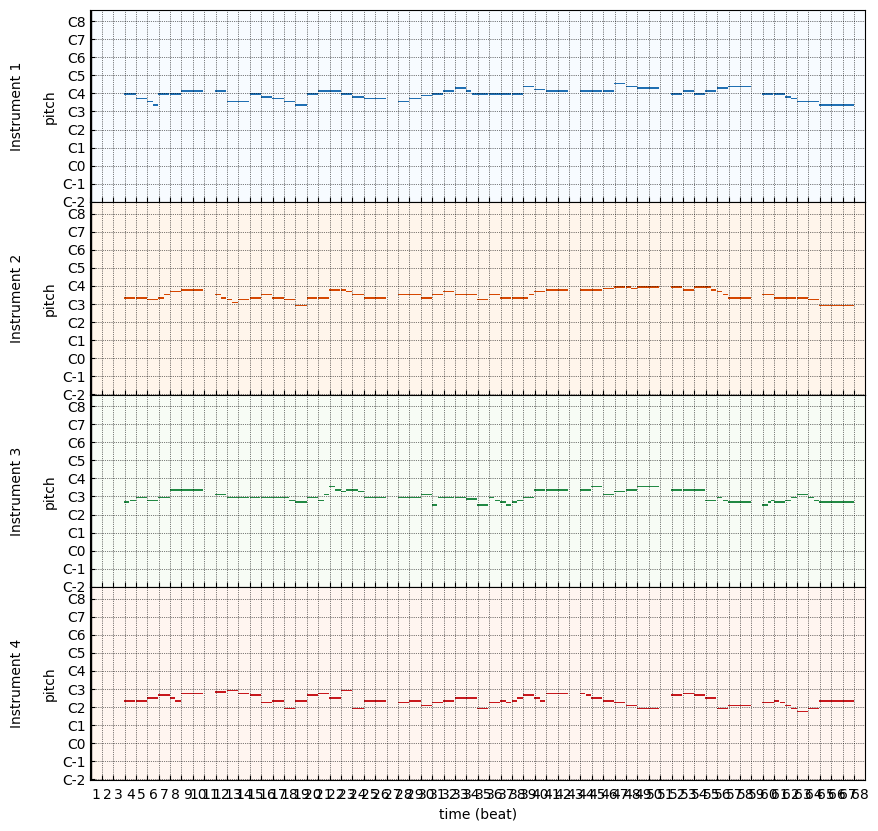

In [11]:
mid_file = mid_files[100]
pr = pypianoroll.read(mid_file)
fig = pypianoroll.plot(pr)
# man hat erst nach dem öffnen der Figur Zugriff auf den handle um die größe zu ändern.
plt.gcf().set_size_inches(10,10,forward = True)

Dateien enthalten Stücke, in denen die einzelnen Stimmen als verschiedene *Tracks* abgespeichert sind. Um eine Datei anzuhören, müssen wir zunächst eine Audiodatei erzeugen.

In [12]:
FluidSynth().midi_to_audio(mid_file, 'output_0.wav')
Audio(filename = 'output_0.wav')

### 3.2 Vorbereitung der Trainingsdaten

Um auf den Daten ein neuronales Netz trainieren zu können, müssen wir sie zunächst in eine geeignete Form bringen. Wir wollen hier Melodien mit dem Prinzip der *Autoregression* erzeugnen, das sie vielleicht schon kennengelernt haben. Das Netzwerk erhält als Input eine Sequenz von Tönen und generiert als Output einen weiteren Ton, welcher dann im nächsten Schritt zur Inputsequenz hinzugefügt wird, aus der das Netz dann wieder einen neuen erzeugt, und so weiter...

Für das Training benötigen wir also Paare aus Sequenzen und dem dazugehörigen nächsten Ton. Wir könnten nun alle verfügbaren Dateien einladen und in kleine Stücke zerschneiden. Das würde aber zu einer riesigen Datenmenge führen. Wir schreiben uns also eine Funktion, die uns jeweils ein *batch* generiert. 

Als Parameter übergeben wir der Funktion die Anzahl der gewünschten Samples, die Länge der Input-Sequenz, die Liste der verfügbaren Midi-Dateien und die zeitliche Auflösung der Pianorroll-Matrix, die im Parameter `resolution` festgelegt wird. Sie bestimmt, in wie viele Teile eine Viertelnote zerlegt wird. Eine `resolution` von 2 bedeutet also, dass wir nur bis auf Achtelnoten auflösen. 

Und wir fügen der Pianoroll eine weitere leere Zeile hinzu (die lediglich Pausen kodiert), da unser Netzwerk immer einen Zielwert haben muss. Quasi: Das Netzwerk erhält die Möglichkeit "sich für eine Pause zu entscheiden"

In [13]:
def generate_data_batch(N, seq_len, file_list, beat_resolution=2):
    """ generate batch of samples.
       x -> sequence, y -> next slice

       """
    X = []
    y = []
    while len(X) < N:
        try:
            mid_file = choice(file_list)
            pr = pypianoroll.read(mid_file,resolution=beat_resolution)
        except:
            print(f"failed to read {mid_file}")
            continue
        # Ein Track von den vieren wird zufällig ausgewählt
        track = choice(pr.tracks)
        ar = track.pianoroll
        if (ar > 0).sum() < 2:
            # not enough content
            continue
        # now add leading zeros of window size
        ar = np.append(np.zeros((seq_len - 1, ar.shape[1])), ar, axis=0)

        # add an extra field for silence
        silence = ar.sum(axis=1) == 0
        ar = np.append(ar, silence[:, np.newaxis], axis=1)

        # binarize:
        ar = (ar > 0) * 1  # we ignore dynamics

        # take 100 samples from each file randomly
        for s in range(100):
            start = np.random.randint(0, ar.shape[0] - seq_len - 1)
            end = start + seq_len

            x = ar[start:end]
            if x[:, :-1].sum()==0:
                # all silent -> boring
                continue
            X.append(ar[start:end])  # turn, so time is last dim
            y.append(ar[end])
            if len(X) == N:
                break

    X = np.array(X)
    y = np.array(y)

    order = np.arange(N)
    shuffle(order)

    return X[order], y[order]

Wir erzeugen ein Sample, um zu sehen, was wir gemacht haben.

Text(0.5, 0, 'time')

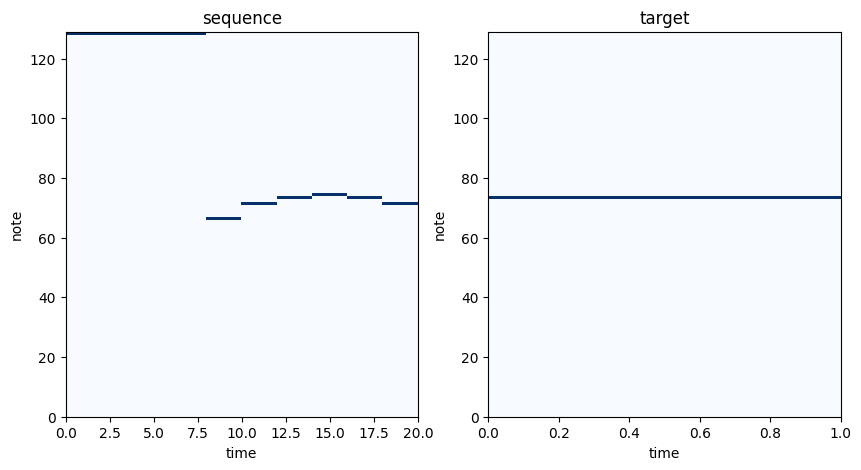

In [14]:
X,y = generate_data_batch(1,20,mid_files)
plt.figure(figsize = (10,5))
plt.subplot(1,2,1)
plt.title('sequence')
plt.pcolor(X[0].T, cmap='Blues')
plt.ylabel('note')
plt.xlabel('time')
plt.subplot(1,2,2)

plt.title('target')
plt.pcolor(y[[0]].T, cmap='Blues')
plt.ylabel('note')
plt.xlabel('time')

## 4.0 Generieren von monophonen Sequenzen

In diesem Abschnitt werden wir ein Netzwerk auf das Erzeugen von monophonen Sequenzen - also Melodien - trainieren. Eine Funktion, die entsprechende Daten erzeugt, haben wir soeben erstellt. 




### 4.1 Parametrisierung und Erstellung des Modells

Zunächst definieren wir einige Parameter für das Modell. Mit `N_train` und `N_test` legen wir fest, wie viele Beispiele in jeder Epoche jeweils für Trainings- und Testphase benutzt werden. `beat_resolution` bestimmt, in wieviele Untereinheiten jeder musikalische Schlag unterteilt wird. Wir wählen hier den Wert 2, was einer Achtelnote entspricht. `seq_len` bestimmt die Anzahl der Zeitschritte, die dem Netzwerk als Input gegeben werden, und somit die Anzahl der Schritte, die bei der Backpropagation Through Time *ausgerollt* werden. Mit der achtfachen `beat_resolution` legen wir hier eine Länge fest, die zwei Viervierteltakten entspricht. 
`n_channels` ist die Breite der Inputdaten. In diesem Fall haben wir die 128 Midi-Noten plus die *Pausenspur*, die wir hinzugefügt haben. Die Anzahl der Epochen, und die `batch_size` bestimmen, wie viele Trainingszyklen das Netzwerk durchläuft und in welcher "Häpchengröße" die Daten verabreicht werden. Der Parameter `dropout` beschreibt den Anteil der Zellen im Netzwerk, die bei jedem Trainingsschritt zufällig deaktiviert werden um Overfitting zu reduzieren. `lstm_units` legt die Anzahl der verwendeten LSTM-Zellen fest. 

In [15]:
# parameters
N_train = 10000
N_test = 2000
beat_resolution = 2
seq_len = beat_resolution*8
n_channels = 129
epochs = 100
batch_size = 32
dropout = 0.2
lstm_units = 64

Die eigentliche Modelldefinition sieht relativ unspektakulär aus.


In [16]:
# Ein sequenzielles Model hat nur einen Strang im Informationsfluss.
model = Sequential()
# eine LSTM-Schicht wird hinzugefügt
model.add(LSTM(lstm_units,input_shape = (seq_len,n_channels)))
# während der Trainingszeit wird ein Teil der units ignoriert, um overfitting zu verhindern
model.add(Dropout(dropout))
model.add(Flatten())
# Am Ende fügen wir eine Klassifikationsschicht hinzu.
model.add(Dense(n_channels,activation = 'softmax'))

model.compile(optimizer ='adam',
                loss = 'categorical_crossentropy',
                metrics=['accuracy'])

In [ ]:
model.summary()

### 4.2 Training
Da wir unsere Trainingsdaten in kleinen Happen erzeugen, müssen wir getrennte Listen für Trainings- und Testdateien anlegen, um keine Überschneidungen zu bekommen.

Zusätzlich werden wir in diesem Fall den Trainingsfortschritt in der Variable `histories` abspeichern, um diesen anschließen visualisieren zu können.

In [17]:
# Wir mischen die Dateinamen, um eine zufällige Verteilung zwischen Trainings- und
# Testdaten zu garantieren.
shuffle(mid_files)
train_ratio = 0.8 # 80% Training, 20% Test
train_files = mid_files[:int(train_ratio*len(mid_files))]
test_files = mid_files[int(train_ratio*len(mid_files)):]
# wir legen eine Liste für die Trainingshistorie an.
histories = [] 

Nun legen wir selber eine Schleife für die gewünschte Anzahl von Epochen an. In jeder Runde generieren wir eine Datenportion und lassen die `fit`-Methode des Modells nur für eine Epoche laufen.

In [18]:
for e in range(epochs):
    #clear_output(wait=True)
    print(f'epoch {e+1} of {epochs}')
    X_train,y_train = generate_data_batch(N_train, seq_len, train_files, beat_resolution = beat_resolution)
    X_test,y_test = generate_data_batch(N_test, seq_len, test_files, beat_resolution = beat_resolution)
    # die Ausgabe der fit-methode wird aufgefangen, um den Fehlerverlauf analysieren zu können
    result = model.fit(x=X_train, y=y_train, batch_size=batch_size,
                       epochs=1, validation_data=(X_test, y_test))
    histories.append(result.history)

epoch 1 of 100
313/313 [==============================] - 10s 8ms/step - loss: 3.1640 - accuracy: 0.2722 - val_loss: 2.9179 - val_accuracy: 0.2290
epoch 2 of 100
failed to read infinite-bach/source/output.mid
313/313 [==============================] - 2s 6ms/step - loss: 2.5087 - accuracy: 0.2796 - val_loss: 2.5036 - val_accuracy: 0.2630
epoch 3 of 100
313/313 [==============================] - 2s 7ms/step - loss: 2.3730 - accuracy: 0.3092 - val_loss: 2.3652 - val_accuracy: 0.2790
epoch 4 of 100
313/313 [==============================] - 2s 6ms/step - loss: 2.2292 - accuracy: 0.3377 - val_loss: 2.1621 - val_accuracy: 0.3490
epoch 5 of 100
313/313 [==============================] - 3s 9ms/step - loss: 2.1147 - accuracy: 0.3575 - val_loss: 2.1392 - val_accuracy: 0.3550
epoch 6 of 100
313/313 [==============================] - 2s 7ms/step - loss: 2.0706 - accuracy: 0.3473 - val_loss: 2.0229 - val_accuracy: 0.3520
epoch 7 of 100
313/313 [==============================] - 3s 8ms/step - loss

Um den Trainingsverlauf bewerten zu können, plotten wir den *loss* für Train- und Testdaten. 

Text(0.5, 0, 'epoch')

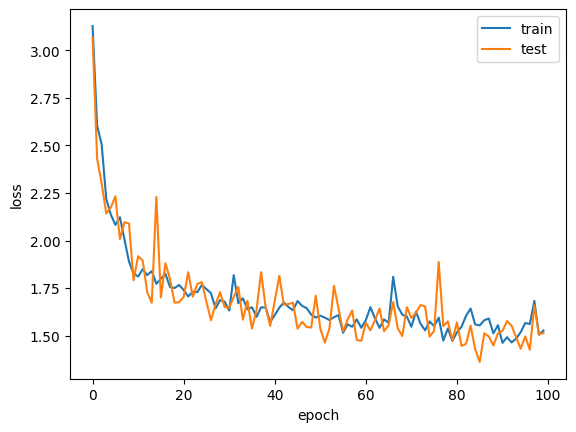

In [ ]:
loss = []
val_loss = []
for history in histories:
    loss.append(history['loss'])
    val_loss.append(history['val_loss'])

plt.plot(loss,label = 'train')
plt.plot(val_loss,label = 'test')
plt.legend()
plt.ylabel('loss')
plt.xlabel('epoch')

Der `loss` scheint nach einigen Iterationen zu konvergieren. Es ist interessant festzustellen, dass der Trainigsfehler relativ kontinuierlich verläuft, obwohl wir in jeder Epoche einen neuen Datensatz ziehen. Dies spricht für den Lernerfolg des Modells. 

Dass die *Accuracy* in Training und Test jeweils nur bei rund 50% liegt, spricht wiederum für Herrn Bach. Wenn man aus zwei Takten mit sehr großer Genauigkeit den nächsten Ton vorhersagen könnte, wäre er wohl nicht als einer der größten Komponisten in die Geschichte eingegangen. 



### 4.3 Generieren von Melodien

Wir haben nun unser Modell auf einigen zig-Tausend Bachschnipseln trainiert und wollen jetzt hören, was es gelernt hat. 

Wie bereits angesprochen werden wir dies nach dem autoregressiven Prinzip tun. Wir geben unserem Modell also einen anfänglichen Input (genannt *Seed*). Für eine vorgegebene Anzahl an Schritten lassen wir jeweils einen weiteren Ton vorhersagen und verwenden diesen zusammen mit dem bisherigen Input als Input für die jeweils nächste Vorhersage.

In [ ]:
def generate(model, seed, n_steps=100, beat_resolution=beat_resolution):
    # ein array für den gesamten output
    generated = np.append(
        seed, np.zeros((n_steps, seed.shape[1]), dtype=seed.dtype), axis=0
    )[np.newaxis, :, :]
    # wir sammeln die predictions in einer liste
    preds = []
    for i in range(n_steps):
        # das model bekommt die letzten Schritte als Input
        model_input = generated[:, i : i + seed.shape[0]]
        prediction = model.predict(model_input).squeeze()
        preds.append(prediction)
        # die note mit der maximalen Wahrscheinlichkeit gewinnt.
        note = np.argmax(prediction)
        # und wird in den Array eingetragen
        generated[:, i + seed.shape[0], note] = 1

    # der array wird nun von überflüssigen dimensionen befreit
    generated = generated.squeeze()
    # die pausenspur wird entfernt
    generated = generated[:, :-1]
    # und stille am anfang abgeschnitten
    gsum = generated.sum(axis=1)
    first = np.where(gsum > 0)[0][0]
    generated = generated[first:]
    # das Ergebnis wird wieder in ein pianoroll-objekt umgewandelt
    tr = pypianoroll.StandardTrack(pianoroll=generated * 60)
    mt = pypianoroll.Multitrack(tracks=[tr],resolution=beat_resolution)
    return mt, np.array(preds)

In [ ]:
seed = choice(X_test) # das Ausgangsmuster
n_steps = 32 # Anzahl der Schritte
output,preds = generate(model, seed, n_steps=n_steps)

1/1 [==============================] - 0s 20ms/step


Wir können nun die entstandene Melodie und die Wahrscheinlichkeitsverteilungen, die das Modell in jedem Zeitschritt erzeugt hat, darstellen lassen.

Text(0.5, 0, 'time (beat)')

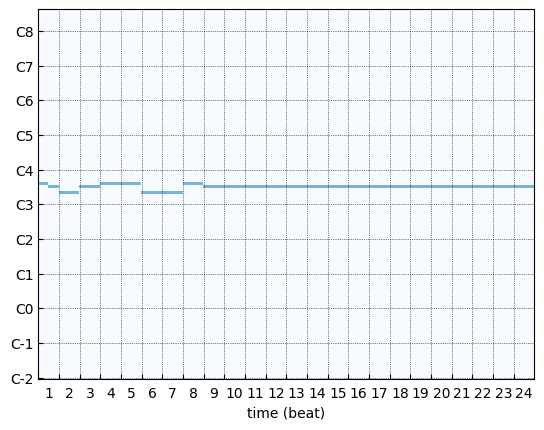

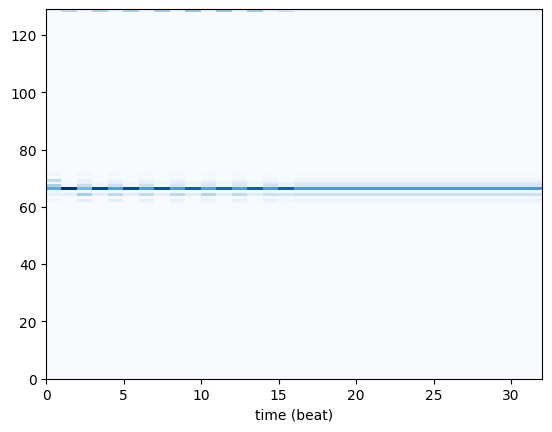

In [ ]:
pypianoroll.plot(output,label = 'x')
output.write('output.mid')
plt.figure()

plt.pcolor(preds.T, cmap='Blues')
plt.xlabel('time (beat)')

Mit einiger Enttäuschung müssen wir feststellen, dass das Model nach einigen Schlägen auf einem einzelnen Ton hängen bleibt und man nicht mehr wirklich von einer Melodie sprechen kann. 

Dies ist ein bekanntes Problem bei der Mustererzeugung mit solchen Modellen. Man kann sich in diesem Fall damit behelfen, die ausgegebenen Warscheinlichkeiten zum Ziehen von Zufallszahlen zu verwenden, um etwas mehr Varianz in den Output zu bekommen. 

Um etwas mehr kontrolle über das Ausmaß dieser Varianz zu bekommen, wird hierbei oft das sogenannte *temperature sampling* verwendet. Die Wahrscheinlichkeiten werden mithilfe eines *Temperatur* genannten Parameters so umgeformt, dass der Kontrast eher erhöht (niedrige Temperatur) oder verwischt wird (hohe Temperatur).

In [ ]:
def heat_distribution(distr, temperature=1.0):
    distr = np.asarray(distr).astype('float64')
    distr = np.log(distr) / temperature
    exp_distr = np.exp(distr)
    distr = exp_distr / np.sum(exp_distr)
    return distr 
    
def temperature_sample(preds, temperature=1.0):
    # helper function to sample an index from a probability array
    probas = heat_distribution(preds,temperature)
    pick = np.random.multinomial(1, probas, 1)
    return np.argmax(pick)

Text(0, 0.5, 'probability')

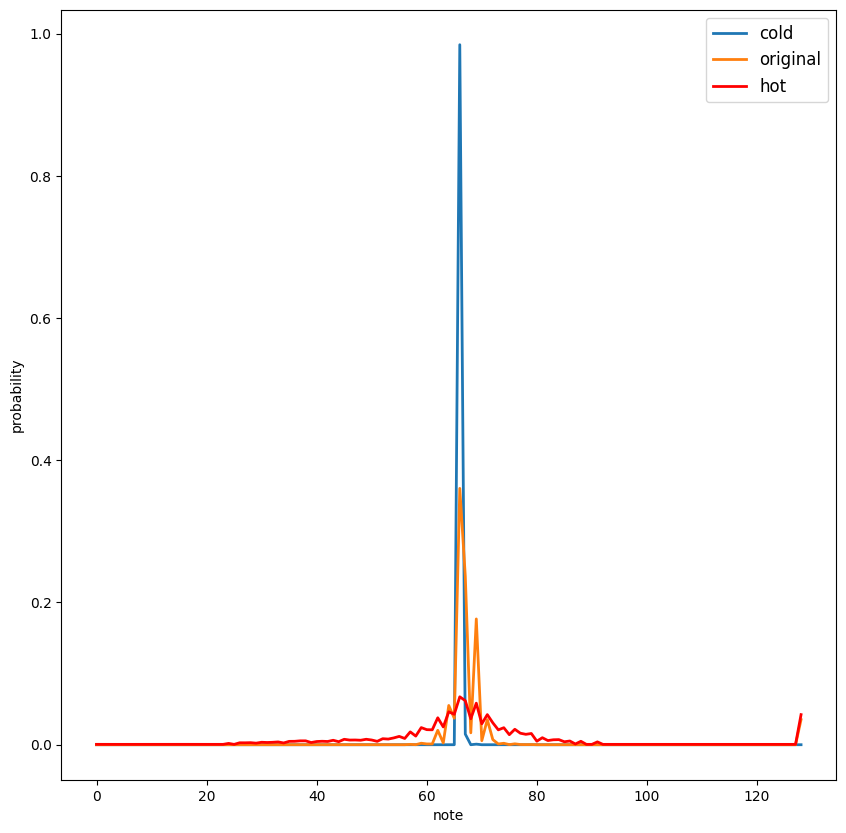

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(heat_distribution(preds[0], 0.1), label='cold', lw=2)
plt.plot(preds[0]/preds[0].sum(), label='original', lw=2)
plt.plot(heat_distribution(preds[0], 5.), label='hot', lw=2,color = 'red')
plt.legend(fontsize=12)
plt.xlabel('note')
plt.ylabel('probability')

Die Grafik zeigt, dass *erhitzte* Verteilungen *breiter* werden, dass also die Varianz steigt, während *gekühlte* Verteilungen stärker auf einen bestimmten Maximalwert hinauslaufen.  

Wir bauen nun also das Temperature-Sampling in unsere `generate`-Funktion ein:

In [ ]:
def generate(
    model, seed, n_steps=100, beat_resolution=beat_resolution, temperature=1.0
):
    # ein array für den gesamten output
    generated = np.append(
        seed, np.zeros((n_steps, seed.shape[1]), dtype=seed.dtype), axis=0
    )[np.newaxis, :, :]
    # wir sammeln die predictions in einer liste
    preds = []
    for i in range(n_steps):
        # das model bekommt die letzten Schritte als Input
        model_input = generated[:, i : i + seed.shape[0]]
        prediction = model.predict(model_input).squeeze()
        preds.append(heat_distribution(prediction,temperature))
        # die note mit der maximalen Wahrscheinlichkeit gewinnt.
        note = temperature_sample(prediction, temperature)
        # und wird in den Array eingetragen
        generated[:, i + seed.shape[0], note] = 1

    # das array wird nun von überflüssigen Dimensionen befreit
    generated = generated.squeeze()
    # die pausenspur wird entfernt
    generated = generated[:, :-1]
    # und stille am anfang abgeschnitten
    gsum = generated.sum(axis=1)
    first = np.where(gsum > 0)[0][0]
    generated = generated[first:]
    # das Ergebnis wird wieder in ein pianoroll-objekt umgewandelt
    tr = pypianoroll.StandardTrack(pianoroll=generated * 60)
    mt = pypianoroll.Multitrack(tracks=[tr], resolution=beat_resolution)
    return mt, np.array(preds)

Nun können wir Beispiele mit etwas Zufall erzeugen.

In [ ]:
seed = choice(X_test) # das Ausgangsmuster
n_steps = 50 # Anzahl der Schritte
output,preds  = generate(model,seed,n_steps = n_steps)

1/1 [==============================] - 0s 22ms/step


Text(0.5, 0, 'time (beat)')

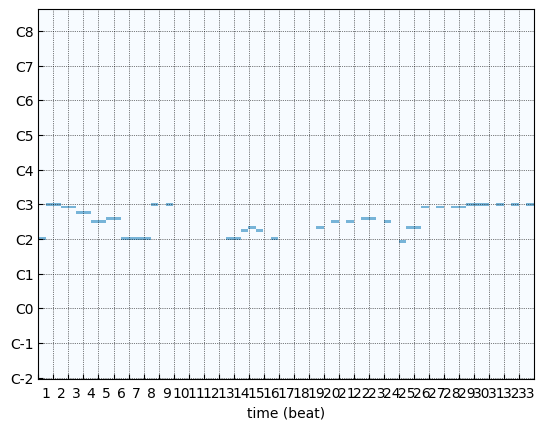

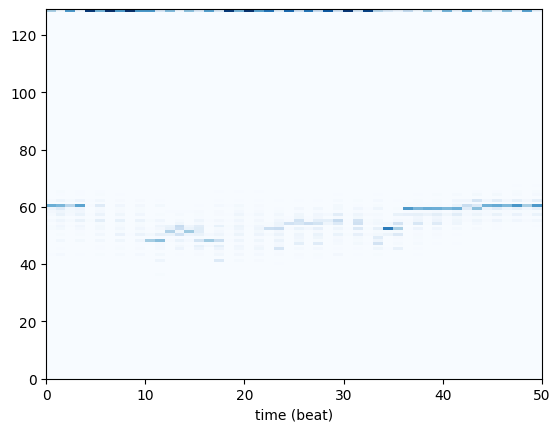

In [ ]:
pypianoroll.plot(output,label = 'x')
output.write('output_1.mid')
plt.figure()

plt.pcolor(preds.T, cmap='Blues')
plt.xlabel('time (beat)')

Die erzeugte *Melodie* sieht nun etwas realistischer aus und hört sich auch so an:

In [ ]:
FluidSynth().midi_to_audio('output_1.mid', 'output_1.wav')
Audio(filename = 'output_1.wav')

## 5.0 Aufgaben

### 5.1 Aufgabe: Einfluss der Temperatur

Wählen Sie eine der Testsequenzen und erzeugen Sie Outputs für verschiedene Temperaturen (z.B. 0.5,1.,2.). Stellen Sie die Warscheinlichkeitsverteilungen der drei erzeugten Sequnzen untereinander dar. 

In [19]:
# Lösung:


### 5.2 Aufgabe: Selbst erstelltes Ausgangsmuster

Erstellen Sie selbst ein Muster als *seed* für die Modellierung. Generieren Sie daraus eine Sequenz. 

**Hinweis**
Das Ausgangsmuster muss die gleiche Form haben wie die Test- und Trainingsmuster und sollte hauptsächlich Nullen und ein paar Einsen enthalten.

In [20]:
# Lösung:

### 5.3 Aufgabe: Parameter `seq_len`

Erforschen Sie den Einfluss des Parameters `seq_len` auf die erzeugten Melodien. Führen Sie hierzu das Training erneut aus mit sehr kurzer `seq_len` (z.B. 2). Was geschieht bei sehr großen Werten (z.B. 50) ?

In [21]:
# Lösung:



### 5.4 Aufgabe: Data Augmentation

Obwohl wir hier fast 500 Bachchoräle haben, handelt es sich für ein Machine Learning Problem doch um einen sehr kleinen Datensatz. Oft versucht man, durch *Data Augmentation* den Trainingsdatensatz künstlich zu vergrößern. Welche Maßnahme würde sich bei diesem Datensatz anbieten? 

In [ ]:
# Lösung:
